In [1]:
%%capture
!pip install num2words
!pip install pymystem3
!pip install nltk
!pip install transliterate
!pip install catboost

In [2]:
import re
import csv
import string
import nltk
import pandas as pd
import numpy as np
from nltk.tokenize import sent_tokenize, word_tokenize
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics.pairwise import cosine_similarity
from num2words import num2words
from pymystem3 import Mystem
from transliterate import translit
from sklearn import metrics
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score,roc_curve
from sklearn.metrics import precision_score,recall_score
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import train_test_split
from catboost import CatBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

nltk.download('punkt')

[nltk_data] Downloading package punkt to /home/repl/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [3]:
product = pd.read_csv('marketing_product.csv', sep=';')

In [4]:
dealerprice = pd.read_csv('marketing_dealerprice.csv', sep=';')

In [5]:
productdealer = pd.read_csv('marketing_productdealerkey.csv', sep=';')

In [6]:
merged_df = pd.merge(dealerprice, productdealer, left_on='product_key', right_on='key', how='left')

# Добавление столбца 'product_id' из productdealer в dealerprice
dealerprice['product_id'] = merged_df['product_id']

In [7]:
dealerprice.sample(3)

,id,product_key,price,product_url,product_name,date,dealer_id,product_id
14135,14200,200375953,5126.0,https://www.bafus.ru/200375953/,Просепт 50 отбеливатель для древесины (20 л) ж...,2023-07-25,3,243.0
943,941,6262565,235.0,https://www.sima-land.ru/7373482,"Средство для снятия обоев, готовый состав 1 л",2023-07-11,13,408.0
16924,17076,530308963,418.0,https://www.ozon.ru/product/530308963,"Антисептик многофункциональный ФБС, ГОСТ 5 л",2023-07-27,18,416.0


In [8]:
dealerprice['product_id'].isna().sum()

2849

Попробуем заполнить пропуски в столбце product_id, сгруппировав по product_name

In [9]:
dealerprice['product_id'] = dealerprice.groupby('product_name')['product_id'].fillna(method='ffill')
dealerprice['product_id'].fillna(0, inplace=True)

In [10]:
dealerprice['product_id'].isna().sum()

0

In [11]:
dealerprice[dealerprice['product_id'] == 0]

,id,product_key,price,product_url,product_name,date,dealer_id,product_id
513,510,1001472231,695.0,https://www.castorama.ru/ognebiozaschita-dlja-...,"ОгнебиозащитадлядревесиныProseptОГНЕБИОPROFII,...",2023-07-11,5,0.0
554,590,932001058,590.0,https://baucenter.ru/sredstva_zashchity_ot_sor...,Удалитель мха Prosept концентрат 1 л,2023-07-11,4,0.0
592,589,932001057,1290.0,https://baucenter.ru/sredstva_zashchity_ot_sor...,Удалитель мха Prosept готовый состав 5 л,2023-07-11,4,0.0
593,591,716501,189.0,https://akson.ru//p/_0_75_bathkrot_111_075/,"Средство для устранения засоров в трубах 0,75л...",2023-07-11,2,0.0
629,626,546241,235.0,https://akson.ru//p/kontsentrat_universalnyy_p...,Концентрат универсальный Prosept Bath Uni с ан...,2023-07-11,2,0.0
...,...,...,...,...,...,...,...,...
20379,20534,901121737,506.0,https://www.ozon.ru/product/901121737,Удалитель мха концентрат 1:1 1 л PROSEPT,2023-07-31,18,0.0
20401,20556,528911039,507.0,https://www.ozon.ru/product/528911039,Герметик акриловый межшовный для деревянных ко...,2023-07-31,18,0.0
20410,20565,685030286,445.0,https://www.ozon.ru/product/685030286,"Жидкое гель-мыло PROSEPT эконом-класса, без кр...",2023-07-31,18,0.0
20414,20569,1090913025,579.0,https://www.ozon.ru/product/1090913025,Герметик акриловый межшовный для деревянных ко...,2023-07-31,18,0.0


от 150 пропусков избавились, уже неплохо. Все остальное заполнили нулями

In [12]:
dealerprice['product_id'] = dealerprice['product_id'].astype(int)

In [13]:
dealerprice.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20416 entries, 0 to 20415
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   id            20416 non-null  int64  
 1   product_key   20416 non-null  object 
 2   price         20416 non-null  float64
 3   product_url   20182 non-null  object 
 4   product_name  20416 non-null  object 
 5   date          20416 non-null  object 
 6   dealer_id     20416 non-null  int64  
 7   product_id    20416 non-null  int64  
dtypes: float64(1), int64(3), object(4)
memory usage: 1.2+ MB


Изучаем столбец name_1c

In [14]:
product['name_1c'].isna().sum()

11

Удалим пропуски

In [15]:
product = product.dropna(subset=['name_1c'])
product['name_1c'].isna().sum()

0

Напишем функцию для очистки текста в целевых столбцах

In [16]:
m = Mystem()

Installing mystem to /home/repl/.local/bin/mystem from http://download.cdn.yandex.net/mystem/mystem-3.1-linux-64bit.tar.gz


In [17]:
from nltk.corpus import stopwords
nltk.download('stopwords')
stop_words = stopwords.words('russian')
words_to_remove = ['один', 'два', 'три']  # Слова для удаления из списка стоп-слов

for word in words_to_remove:
    if word in stop_words:
        stop_words.remove(word)
print(stop_words)

['и', 'в', 'во', 'не', 'что', 'он', 'на', 'я', 'с', 'со', 'как', 'а', 'то', 'все', 'она', 'так', 'его', 'но', 'да', 'ты', 'к', 'у', 'же', 'вы', 'за', 'бы', 'по', 'только', 'ее', 'мне', 'было', 'вот', 'от', 'меня', 'еще', 'нет', 'о', 'из', 'ему', 'теперь', 'когда', 'даже', 'ну', 'вдруг', 'ли', 'если', 'уже', 'или', 'ни', 'быть', 'был', 'него', 'до', 'вас', 'нибудь', 'опять', 'уж', 'вам', 'ведь', 'там', 'потом', 'себя', 'ничего', 'ей', 'может', 'они', 'тут', 'где', 'есть', 'надо', 'ней', 'для', 'мы', 'тебя', 'их', 'чем', 'была', 'сам', 'чтоб', 'без', 'будто', 'чего', 'раз', 'тоже', 'себе', 'под', 'будет', 'ж', 'тогда', 'кто', 'этот', 'того', 'потому', 'этого', 'какой', 'совсем', 'ним', 'здесь', 'этом', 'почти', 'мой', 'тем', 'чтобы', 'нее', 'сейчас', 'были', 'куда', 'зачем', 'всех', 'никогда', 'можно', 'при', 'наконец', 'об', 'другой', 'хоть', 'после', 'над', 'больше', 'тот', 'через', 'эти', 'нас', 'про', 'всего', 'них', 'какая', 'много', 'разве', 'эту', 'моя', 'впрочем', 'хорошо', 'свою

[nltk_data] Downloading package stopwords to /home/repl/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [18]:
def clean_text(text):

    def replace_numbers_with_words(words):
        for i in range(len(words)):
            word = words[i]
            if word.isdigit():
                num_word = num2words(int(word), lang='ru')
                words[i] = num_word

        replaced_text = ' '.join(words)
        return replaced_text

    text_no_punct = re.sub(rf"[{re.escape(''.join(set(string.punctuation) - {'.', ',', ':', '-' }))}]", " ", text)
    text_no_punct = text_no_punct.replace('.', ',')

    text_with_spaces = re.sub(r'(\d)([A-Za-zА-ЯЁа-яё])|([A-Za-zА-ЯЁа-яё])(\d)', r'\1 \2', text_no_punct)
    text_with_spaces = re.sub(r'(?<=[а-я])(?=[А-Я])|(?<=[a-z])(?=[A-Z])', ' ', text_with_spaces)
    text_with_spaces = re.sub(r'(\d+),(\d+)', r'\1.\2', text_with_spaces)
    text_with_spaces = re.sub(r'(\b)\,', r'\1', text_with_spaces)

    split_words = re.sub(r'(?<=[А-ЯЁа-яё])(?=[A-Za-z])|(?<=[A-Za-z])(?=[А-ЯЁа-яё])', ' ', text_with_spaces)
    split_words = re.sub(r'\bл\b', 'литр', split_words)
    split_words = re.sub(r'\bг\b', 'грамм', split_words)
    split_words = re.sub(r'\bкг\b', 'килограмм', split_words)
    split_words = re.sub(r'\bмл\b', 'миллилитр', split_words)
    split_words = split_words.lower()
    split_words = split_words.replace('prosept', '').replace('просепт', '').replace('жидкое', '').replace('средство', '')
    lemmatized_text = m.lemmatize(split_words)
    filtered_words = [word.strip() for word in lemmatized_text if word.lower().strip() not in stop_words]

    replaced_numbers_text = replace_numbers_with_words(filtered_words)
    transliterated_text = [translit(word, 'ru', reversed=True) for word in replaced_numbers_text]
    cleaned_text = "".join(transliterated_text)
    cleaned_text = re.sub(r'\s+', ' ', cleaned_text).strip()

    return cleaned_text

In [19]:
product['name_1c_clean'] = product['name_1c'].apply(clean_text)

In [20]:
product['name_1c_clean']

0      antiseptik nevymyvaemyj otvetstvennyj konstruk...
1      antigololed - tridtsat' dva gotovyj sostav dve...
2      germetik akrilovyj tsvet sosna f p shest'sot m...
3      konditsioner bel'e korolevskij iris crystal ri...
5      grunt betonokontakt gladkij poverhnost' nanese...
                             ...                        
491    uborka pomeschenie pozhar dezinfitsirujuschij ...
492    gel' stirka sherst' shelk delikatnyj tkan' cry...
493    c redstvo chistka gril' duhovka cooky grill ge...
494    professional'nyj myt'e pol polimernyj pokrytie...
495    usilennyj udalenie rzhavchina mineral'nyj otlo...
Name: name_1c_clean, Length: 485, dtype: object

In [21]:
dealerprice['product_name_clean'] = dealerprice['product_name'].apply(clean_text)

In [22]:
unique_df_1 = product.drop_duplicates(subset=['name_1c_clean'])

In [23]:
unique_df_2 = dealerprice.drop_duplicates(subset=['product_name_clean'])

In [24]:
unique_df_1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 468 entries, 0 to 495
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Unnamed: 0         468 non-null    int64  
 1   id                 468 non-null    int64  
 2   article            468 non-null    object 
 3   ean_13             447 non-null    float64
 4   name               468 non-null    object 
 5   cost               467 non-null    float64
 6   recommended_price  467 non-null    float64
 7   category_id        430 non-null    float64
 8   ozon_name          443 non-null    object 
 9   name_1c            468 non-null    object 
 10  wb_name            441 non-null    object 
 11  ozon_article       350 non-null    float64
 12  wb_article         323 non-null    float64
 13  ym_article         321 non-null    object 
 14  wb_article_td      32 non-null     object 
 15  name_1c_clean      468 non-null    object 
dtypes: float64(6), int64(2), o

In [25]:
unique_df_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1864 entries, 0 to 20401
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   id                  1864 non-null   int64  
 1   product_key         1864 non-null   object 
 2   price               1864 non-null   float64
 3   product_url         1840 non-null   object 
 4   product_name        1864 non-null   object 
 5   date                1864 non-null   object 
 6   dealer_id           1864 non-null   int64  
 7   product_id          1864 non-null   int64  
 8   product_name_clean  1864 non-null   object 
dtypes: float64(1), int64(3), object(5)
memory usage: 145.6+ KB


In [26]:
documents_set1_cleaned = np.array(unique_df_1['name_1c_clean'])

In [27]:
documents_set2_cleaned = np.array(unique_df_2['product_name_clean'])

Посмотрим на самые частые слова в двух датасетах

In [28]:
from collections import Counter
set2 = ' '.join(documents_set2_cleaned)

word_counts = Counter(set2.split(' '))

most_common_words_2 = word_counts.most_common(10)
print(most_common_words_2)

[('litr', 1257), ('odin', 693), ("pjat'", 683), ('-', 678), ('kontsentrat', 385), ('antiseptik', 334), ('kilogramm', 269), ('millilitr', 237), ("desjat'", 229), ('tri', 212)]


In [29]:
set1 = ' '.join(documents_set1_cleaned)

word_counts = Counter(set1.split(' '))

most_common_words_1 = word_counts.most_common(10)
print(most_common_words_1)

[('litr', 366), ('odin', 137), ("pjat'", 131), ('-', 101), ('antiseptik', 100), ('kontsentrat', 82), ('kilogramm', 59), ('dva', 56), ("myt'e", 54), ("gel'", 40)]


Векторизуем два набора данных найдем косинусные расстояния

In [30]:
tfidf_vectorizer = TfidfVectorizer()
tfidf_matrix_set2 = tfidf_vectorizer.fit_transform(documents_set2_cleaned)
tfidf_matrix_set1 = tfidf_vectorizer.transform(documents_set1_cleaned)

In [31]:
similarities = cosine_similarity(tfidf_matrix_set2, tfidf_matrix_set1)

In [32]:
similarities.shape

(1864, 468)

In [ ]:
#for i, doc_set1 in enumerate(np.array(unique_df_2['product_name'])):
#    similarities_for_doc = similarities[i]
#    ranked_similarities = sorted(
#        enumerate(similarities_for_doc),
#        key=lambda x: x[1],
#        reverse=True
#    )
#    print(f"Для документа '{doc_set1}' наиболее близкие пять документов из product['name']:")
#    top_five = min(5, len(ranked_similarities))
#    for idx, sim in ranked_similarities[:top_five]:
#        unique_names = np.array(unique_df_1['name_1c']) 
#        similar_doc = unique_names[idx]
#        print(f"Документ '{similar_doc}' - сходство: {sim}")
#    print("-------------------------------------------------------------")

In [34]:
data = []

for i, doc_set1 in enumerate(np.array(unique_df_2['product_name'])):
    similarities_for_doc = similarities[i]
    ranked_similarities = sorted(
        enumerate(similarities_for_doc),
        key=lambda x: x[1],
        reverse=True
    )
    top_five = min(5, len(ranked_similarities))
    max_similarity = ranked_similarities[0][1]  
    
    product_id_dealer = unique_df_2['product_id'].iloc[i]

    for rank, (idx, sim) in enumerate(ranked_similarities[:top_five]):
        if idx < len(np.array(unique_df_1['name_1c'])):  
            doc_name_dealerprice = doc_set1
            doc_name_product = np.array(unique_df_1['name_1c'])[idx]
            product_id = unique_df_1['id'].iloc[idx] 

            if product_id_dealer == product_id:
                target = 1
            elif product_id_dealer == 0  and sim == max_similarity:
                target = 1
            else:
                target = 0

            data.append({
                'Документ_из_dealerprice': doc_name_dealerprice,
                'Документ_из_product': doc_name_product,
                'Сходство': sim,
                'Ранг': rank + 1,
                'product_id_dealer': product_id_dealer,
                'product_id': product_id,
                'target': target
            })
        else:
            print(f"Индекс {idx} выходит за границы.")

df_cos = pd.DataFrame(data)

In [35]:
#df_cos.to_csv('result_data.csv', index=False)

In [36]:
df_cos[df_cos['product_id_dealer'] == 0]

,Документ_из_dealerprice,Документ_из_product,Сходство,Ранг,product_id_dealer,product_id,target
2290,Удалитель мха Prosept концентрат 1 л,"Удалитель мха, концентрат, PROSEPT, концентрат...",0.962329,1,0,211,1
2291,Удалитель мха Prosept концентрат 1 л,"Удалитель мха PROSEPT, 1 л.",0.943000,2,0,209,0
2292,Удалитель мха Prosept концентрат 1 л,"Удалитель мха PROSEPT, 5 л.",0.862156,3,0,210,0
2293,Удалитель мха Prosept концентрат 1 л,"Набор Удалитель мха, концентрат 1 л, 2 шт",0.585280,4,0,483,0
2294,Удалитель мха Prosept концентрат 1 л,"Защитная пропитка от мха PROSEPT, концентрат, ...",0.516720,5,0,212,0
...,...,...,...,...,...,...,...
9315,Герметик акриловый межшовный для деревянных ко...,"Герметик акриловый цвет Орех, 3 кг",0.670325,1,0,374,1
9316,Герметик акриловый межшовный для деревянных ко...,"Герметик акриловый цвет Орех 0,6 л",0.668321,2,0,373,0
9317,Герметик акриловый межшовный для деревянных ко...,"Герметик акриловый цвет Орех, 7 кг",0.664411,3,0,375,0
9318,Герметик акриловый межшовный для деревянных ко...,"Герметик акриловый цвет Орех, 15 кг",0.617846,4,0,376,0


In [37]:
df_cos['target'].value_counts()

0    7651
1    1669
Name: target, dtype: int64

In [38]:
df_cos.head()

,Документ_из_dealerprice,Документ_из_product,Сходство,Ранг,product_id_dealer,product_id,target
0,Средство универсальное Prosept Universal Spray...,Универсальное чистящее средство PROSEPT Univer...,0.776297,1,12,12,1
1,Средство универсальное Prosept Universal Spray...,Профессиональное чистящее средство PROSEPT Uni...,0.661454,2,12,13,0
2,Средство универсальное Prosept Universal Spray...,Универсальное моющее и чистящее средствоUniver...,0.612334,3,12,15,0
3,Средство универсальное Prosept Universal Spray...,Профессиональное универсальное моющее средство...,0.562548,4,12,5,0
4,Средство универсальное Prosept Universal Spray...,Профессиональное универсальное моющее средство...,0.545281,5,12,4,0


Результаты выглядят более менее адекватно

Попробуем использовать метод ближайших соседей

In [39]:
documents = np.concatenate([documents_set1_cleaned, documents_set2_cleaned])
tfidf_vectorizer = TfidfVectorizer()
tfidf_matrix = tfidf_vectorizer.fit_transform(documents)

tfidf_matrix_set1 = tfidf_matrix[:len(documents_set1_cleaned)]
tfidf_matrix_set2 = tfidf_matrix[len(documents_set1_cleaned):]

n_neighbors = 20
nbrs = NearestNeighbors(n_neighbors=n_neighbors, metric='cosine').fit(tfidf_matrix_set1)
distances, indices = nbrs.kneighbors(tfidf_matrix_set2)

Собираем таблицу для последующего обучения классификатора: добаляем столбец target, где в случае, если происходит совпадение product_id_dealer и product_id поставщика ставим 1, в остальных случаях 0

In [40]:
data = []

for i, neighbors in enumerate(indices):
    distances_for_doc = distances[i]
    for rank, (idx, dist) in enumerate(zip(neighbors, distances_for_doc)):
        doc_name_set1 = documents_set1_cleaned[idx]  
        doc_name_set2 = documents_set2_cleaned[i]  

        if idx < len(np.array(unique_df_1['name_1c'])):  
            doc_name_dealerprice = np.array(unique_df_2['product_name'])[i]
            doc_name_product = np.array(unique_df_1['name_1c'])[idx]
            product_id_dealer = unique_df_2['product_id'].iloc[i]
            product_id = unique_df_1['id'].iloc[idx]  
            
            if product_id_dealer == product_id:
                target = 1
#            elif product_id_dealer == 0 and rank == 0:  
#                target = 1
            else:
                target = 0

            data.append({
                'document_set1': doc_name_set1,
                'document_set2': doc_name_set2,
                'name_dealerprice' : doc_name_dealerprice,
                'name_1c' : doc_name_product,
                'distance': dist,
                'rank': rank + 1,
                'product_id_dealer': product_id_dealer,
                'product_id': product_id,
                'target': target
            })
        else:
            print(f"Index {idx} is out of bounds.")

df_nn = pd.DataFrame(data)

In [41]:
#df_nn.to_csv('result_data_NN.csv', index=False)

In [42]:
df_nn['target'].value_counts()

0    35793
1     1487
Name: target, dtype: int64

In [43]:
df_nn[df_nn['product_id_dealer'] == 0]

,document_set1,document_set2,name_dealerprice,name_1c,distance,rank,product_id_dealer,product_id,target
9160,udalitel' moh kontsentrat kontsentrat odin litr,udalitel' moh kontsentrat odin litr,Удалитель мха Prosept концентрат 1 л,"Удалитель мха, концентрат, PROSEPT, концентрат...",0.038628,1,0,211,0
9161,udalitel' moh odin litr,udalitel' moh kontsentrat odin litr,Удалитель мха Prosept концентрат 1 л,"Удалитель мха PROSEPT, 1 л.",0.059380,2,0,209,0
9162,udalitel' moh pjat' litr,udalitel' moh kontsentrat odin litr,Удалитель мха Prosept концентрат 1 л,"Удалитель мха PROSEPT, 5 л.",0.143453,3,0,210,0
9163,nabor udalitel' moh kontsentrat odin litr dva sht,udalitel' moh kontsentrat odin litr,Удалитель мха Prosept концентрат 1 л,"Набор Удалитель мха, концентрат 1 л, 2 шт",0.314750,4,0,483,0
9164,nabor udalitel' moh gotovyj sostav odin litr d...,udalitel' moh kontsentrat odin litr,Удалитель мха Prosept концентрат 1 л,"Набор Удалитель мха, готовый состав, 1 л, 2 шт",0.432989,5,0,484,0
...,...,...,...,...,...,...,...,...,...
37275,germetik akrilovyj tsvet sosna pjatnadtsat' ki...,germetik akrilovyj mezhshovnyj derevjannyj kon...,Герметик акриловый межшовный для деревянных ко...,"Герметик акриловый цвет Сосна, 15 кг",0.601138,16,0,372,0
37276,germetik akrilovyj tsvet medovyj pjatnadtsat' ...,germetik akrilovyj mezhshovnyj derevjannyj kon...,Герметик акриловый межшовный для деревянных ко...,"Герметик акриловый цвет медовый, 15 кг.",0.603330,17,0,459,0
37277,germetik akrilovyj shov derevjannyj dom konstr...,germetik akrilovyj mezhshovnyj derevjannyj kon...,Герметик акриловый межшовный для деревянных ко...,Герметик акриловый для швов для деревянных дом...,0.607549,18,0,465,0
37278,germetik akrilovyj belyj shov derevjannyj dom ...,germetik akrilovyj mezhshovnyj derevjannyj kon...,Герметик акриловый межшовный для деревянных ко...,Герметик акриловый белый для швов для деревянн...,0.620738,19,0,466,0


Попробуем использовать в качестве features столбцы document_set2 и document_set1, а также слитный столбец document_set2+document_set2, а также столбец distance

Добавим в таблицу объединенный столбец

In [44]:
df_nn['combined_documents'] = df_nn['document_set1'] + ' ' + df_nn['document_set2']

In [45]:
df_nn.sample(3)

,document_set1,document_set2,name_dealerprice,name_1c,distance,rank,product_id_dealer,product_id,target,combined_documents
36681,ognebiozaschita drevesina ognebio prof l1 grup...,ognebiozaschita professional'nyj drevesina ogn...,Огнебиозащита профессиональная для древесины P...,Огнебиозащита для древесиныPROSEPT ОГНЕБИО PRO...,0.293354,2,298,309,0,ognebiozaschita drevesina ognebio prof l1 grup...
10002,shampun' chistka kover mjagkij mebel' carpet s...,chistka kovrovyj pokrytie carpet dry clean sha...,Средство для чистки ковровых покрытий Prosept ...,Шампунь для чистки ковров и мягкой мебели PROS...,0.652016,3,170,167,0,shampun' chistka kover mjagkij mebel' carpet s...
7928,professional'nyj myt'e vosstanovlenie pol poli...,uhod mebel' universal polish pjat'sot millilitr,Средство для ухода за мебелью PROSEPT Universa...,Профессиональное средство для мытья и восстано...,0.781127,9,16,35,0,professional'nyj myt'e vosstanovlenie pol poli...


In [46]:
df_nn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37280 entries, 0 to 37279
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   document_set1       37280 non-null  object 
 1   document_set2       37280 non-null  object 
 2   name_dealerprice    37280 non-null  object 
 3   name_1c             37280 non-null  object 
 4   distance            37280 non-null  float64
 5   rank                37280 non-null  int64  
 6   product_id_dealer   37280 non-null  int64  
 7   product_id          37280 non-null  int64  
 8   target              37280 non-null  int64  
 9   combined_documents  37280 non-null  object 
dtypes: float64(1), int64(4), object(5)
memory usage: 2.8+ MB


Чтобы потом еще раз не искать ближайших соседей, сразу сделаем валидационную выборку (первые 1865 строк)

Разделим сразу данные на train и test

In [47]:
X1 = df_nn[['document_set1', 'document_set2', 'distance']]
X2 = df_nn[['combined_documents', 'distance']]
y = df_nn['target']

In [48]:
X1_valid = X1.head(7460)
X1 = X1.drop(X1.index[:7460])
X1.head()


,document_set1,document_set2,distance
7460,antiseptik banja sauna sauna kontsentrat pjat'...,chistka banja sauna pjat'sot millilitr,0.355000
7461,antiseptik banja sauna eco sauna pjat' litr,chistka banja sauna pjat'sot millilitr,0.379338
7462,antiseptik banja sauna sauna kontsentrat odin ...,chistka banja sauna pjat'sot millilitr,0.397068
7463,antiseptik banja sauna eco sauna desjat' litr,chistka banja sauna pjat'sot millilitr,0.421666
7464,myt' banja sauna multipower wood odin litr,chistka banja sauna pjat'sot millilitr,0.573493


In [49]:
X2_valid = X2.head(7460)
X2 = X2.drop(X2.index[:7460])
X2.head()

,combined_documents,distance
7460,antiseptik banja sauna sauna kontsentrat pjat'...,0.355000
7461,antiseptik banja sauna eco sauna pjat' litr ch...,0.379338
7462,antiseptik banja sauna sauna kontsentrat odin ...,0.397068
7463,antiseptik banja sauna eco sauna desjat' litr ...,0.421666
7464,myt' banja sauna multipower wood odin litr chi...,0.573493


In [50]:
y_valid = y.head(7460)
y1 = y.drop(y.index[:7460])
y1.head()

7460    0
7461    0
7462    0
7463    0
7464    0
Name: target, dtype: int64

In [51]:
X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size=0.2, random_state=42, shuffle = True, stratify = y1)

In [52]:
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y1, test_size=0.2, random_state=42, shuffle = True, stratify = y1)

In [53]:
tfidf_vectorizer = TfidfVectorizer()
X_train_tfidf = tfidf_vectorizer.fit_transform(X2_train['combined_documents'])
X_test_tfidf = tfidf_vectorizer.transform(X2_test['combined_documents'])
X_valid_tfidf = tfidf_vectorizer.transform(X2_valid['combined_documents'])

In [54]:
columns = tfidf_vectorizer.get_feature_names_out()
X_train_tfidf = pd.DataFrame(X_train_tfidf.toarray(), columns=columns)
X_train_tfidf = np.concatenate((X2_train['distance'][:, np.newaxis], X_train_tfidf), axis=1)

In [55]:
X_test_tfidf = pd.DataFrame(X_test_tfidf.toarray(), columns=columns)
X_test_tfidf = np.concatenate((X2_test['distance'][:, np.newaxis], X_test_tfidf), axis=1)

In [56]:
X_valid_tfidf = pd.DataFrame(X_valid_tfidf.toarray(), columns=columns)
X_valid_tfidf = np.concatenate((X2_valid['distance'][:, np.newaxis], X_valid_tfidf), axis=1)

In [62]:
tfidf_vectorizer_full = TfidfVectorizer()
X_full_tfidf = tfidf_vectorizer_full.fit_transform(df_nn['combined_documents'])

In [63]:
columns = tfidf_vectorizer_full.get_feature_names_out()
X_full_tfidf = pd.DataFrame(X_full_tfidf.toarray(), columns=columns)
X_full_tfidf = np.concatenate((df_nn['distance'][:, np.newaxis], X_full_tfidf), axis=1)

Логистическая регрессия

In [64]:
model_lr = LogisticRegression(class_weight='balanced', random_state=42)

params = {'penalty' : ['l2'],
           'solver' : ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']}

gs_lr = GridSearchCV(model_lr, params, scoring='roc_auc', cv=3, n_jobs=-1, verbose=2, error_score='raise')
gs_lr.fit(X_full_tfidf, y)

Fitting 3 folds for each of 5 candidates, totalling 15 fits


GridSearchCV(cv=3, error_score='raise',
             estimator=LogisticRegression(class_weight='balanced',
                                          random_state=42),
             n_jobs=-1,
             param_grid={'penalty': ['l2'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag',
                                    'saga']},
             scoring='roc_auc', verbose=2)

In [65]:
gs_lr.best_score_, gs_lr.best_params_

(0.921032301690424, {'penalty': 'l2', 'solver': 'lbfgs'})

(0.921032301690424, {'penalty': 'l2', 'solver': 'lbfgs'})

In [66]:
# Обучение классификатора
clf = LogisticRegression(class_weight='balanced', penalty = 'l2', solver = 'lbfgs')
clf.fit(X_train_tfidf, y2_train)

LogisticRegression(class_weight='balanced')

In [67]:
y_pred = clf.predict(X_test_tfidf)

accuracy = accuracy_score(y2_test, y_pred)
report = classification_report(y2_test, y_pred)

In [68]:
accuracy

0.8838028169014085

In [69]:
print(report)

              precision    recall  f1-score   support

           0       0.99      0.88      0.94      5738
           1       0.23      0.87      0.36       226

    accuracy                           0.88      5964
   macro avg       0.61      0.88      0.65      5964
weighted avg       0.97      0.88      0.91      5964



CatBoostClassifier без предварительного кодирования текстовых данных

In [70]:
categorical = ['combined_documents']
numeric_features = ['distance']

In [71]:
X2_train_cat = X2_train.copy()
X2_train_cat[categorical] = X2_train_cat[categorical].astype('str')
X2_test_cat = X2_test.copy()
X2_test_cat[categorical] = X2_test_cat[categorical].astype('str')
X2 = X2.copy()
X2[categorical] = X2[categorical].astype('str')
X2_valid_cat = X2_valid.copy()
X2_valid_cat[categorical] = X2_valid_cat[categorical].astype('str')

In [72]:
model = CatBoostClassifier(text_features=categorical, random_state=42)

params = {'learning_rate': [0.2, 0.4, 0.8],
#        'depth': [4, 6, 10],
#        'l2_leaf_reg': [3, 5, 8],
        'iterations': [200, 250, 500]}

gs_ctb_ = GridSearchCV(model, params, scoring='roc_auc', cv=5, n_jobs=-1, verbose=2, error_score='raise')
gs_ctb_.fit(X2, y1)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV] END ...........................penalty=l2, solver=lbfgs; total time=   5.2s
[CV] END ............................penalty=l2, solver=saga; total time=  30.2s
0:	learn: 0.2912525	total: 104ms	remaining: 20.6s
1:	learn: 0.1557683	total: 291ms	remaining: 28.8s
2:	learn: 0.1208360	total: 523ms	remaining: 34.4s
3:	learn: 0.1122764	total: 807ms	remaining: 39.5s
4:	learn: 0.1099122	total: 1.11s	remaining: 43.4s
5:	learn: 0.1050438	total: 1.5s	remaining: 48.5s
6:	learn: 0.1001759	total: 1.91s	remaining: 52.6s
7:	learn: 0.0965700	total: 2.22s	remaining: 53.2s
8:	learn: 0.0932387	total: 2.61s	remaining: 55.4s
9:	learn: 0.0914463	total: 3.01s	remaining: 57.3s
10:	learn: 0.0903088	total: 3.43s	remaining: 58.9s
11:	learn: 0.0888140	total: 3.82s	remaining: 59.9s
12:	learn: 0.0863774	total: 4.22s	remaining: 1m
13:	learn: 0.0854104	total: 4.6s	remaining: 1m 1s
14:	learn: 0.0850501	total: 4.88s	remaining: 1m
15:	learn: 0.0842566	total: 5.2

GridSearchCV(cv=5, error_score='raise',
             estimator=<catboost.core.CatBoostClassifier object at 0x7ffa08450130>,
             n_jobs=-1,
             param_grid={'iterations': [200, 250, 500],
                         'learning_rate': [0.2, 0.4, 0.8]},
             scoring='roc_auc', verbose=2)

In [73]:
gs_ctb_.best_score_, gs_ctb_.best_params_

(0.9398639446713097, {'iterations': 500, 'learning_rate': 0.4})

(0.9398639446713097, {'iterations': 500, 'learning_rate': 0.4})

Получилcя roc_auc как у логистической регрессии

попробуем обучиться на столбцах отдельно

In [74]:
categorical = ['document_set1', 'document_set2']
numeric_features = ['distance']

In [75]:
X1_train_cat = X1_train.copy()
X1_train_cat[categorical] = X1_train_cat[categorical].astype('str')
X1_test_cat = X1_test.copy()
X1_test_cat[categorical] = X1_test_cat[categorical].astype('str')
X1 = X1.copy()
X1[categorical] = X1[categorical].astype('str')
X1_valid_cat = X1_valid.copy()
X1_valid_cat[categorical] = X1_valid_cat[categorical].astype('str')

In [76]:
model = CatBoostClassifier(text_features=categorical, random_state=42)

params = {'learning_rate': [0.2, 0.4],
#        'depth': [6, 10],
#        'l2_leaf_reg': [3, 5],
        'iterations': [250, 500]}

gs_ctb_ = GridSearchCV(model, params, scoring='roc_auc', cv=5, n_jobs=-1, verbose=2, error_score='raise')
gs_ctb_.fit(X1, y1)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
374:	learn: 0.0171560	total: 2m 7s	remaining: 42.6s
375:	learn: 0.0169842	total: 2m 8s	remaining: 42.3s
376:	learn: 0.0169380	total: 2m 8s	remaining: 41.9s
377:	learn: 0.0169192	total: 2m 8s	remaining: 41.6s
378:	learn: 0.0168891	total: 2m 9s	remaining: 41.2s
379:	learn: 0.0168736	total: 2m 9s	remaining: 40.9s
380:	learn: 0.0168291	total: 2m 9s	remaining: 40.5s
381:	learn: 0.0168033	total: 2m 10s	remaining: 40.2s
382:	learn: 0.0167756	total: 2m 10s	remaining: 39.8s
383:	learn: 0.0167039	total: 2m 10s	remaining: 39.4s
384:	learn: 0.0166625	total: 2m 10s	remaining: 39.1s
385:	learn: 0.0166382	total: 2m 11s	remaining: 38.8s
386:	learn: 0.0165620	total: 2m 11s	remaining: 38.4s
387:	learn: 0.0164897	total: 2m 12s	remaining: 38.1s
388:	learn: 0.0164537	total: 2m 12s	remaining: 37.8s
389:	learn: 0.0164144	total: 2m 12s	remaining: 37.4s
390:	learn: 0.0163763	total: 2m 13s	remaining: 37.1s
391:	learn: 0.0163602	total: 2m 13s	remaining:

GridSearchCV(cv=5, error_score='raise',
             estimator=<catboost.core.CatBoostClassifier object at 0x7ffa08458fa0>,
             n_jobs=-1,
             param_grid={'iterations': [250, 500], 'learning_rate': [0.2, 0.4]},
             scoring='roc_auc', verbose=2)

In [77]:
gs_ctb_.best_score_, gs_ctb_.best_params_

(0.9417359570515659, {'iterations': 500, 'learning_rate': 0.2})

(0.9433141236737036,
 {'depth': 6, 'iterations': 500, 'l2_leaf_reg': 5, 'learning_rate': 0.2})


Roc-auc ниже, чем у логистической регрессии, но из интереса попробуем обучить модель

In [78]:
ctb_ = CatBoostClassifier(random_state=42, depth = 6, l2_leaf_reg = 5, iterations=500, learning_rate=0.2, text_features=['document_set1', 'document_set2'])
ctb_.fit(X1_train_cat, y1_train)

0:	learn: 0.4445632	total: 43.5ms	remaining: 21.7s
1:	learn: 0.2884698	total: 90.4ms	remaining: 22.5s
2:	learn: 0.2157370	total: 137ms	remaining: 22.6s
3:	learn: 0.1722872	total: 184ms	remaining: 22.9s
4:	learn: 0.1443849	total: 233ms	remaining: 23s
5:	learn: 0.1311186	total: 280ms	remaining: 23.1s
6:	learn: 0.1219610	total: 331ms	remaining: 23.3s
7:	learn: 0.1190950	total: 379ms	remaining: 23.3s
8:	learn: 0.1139546	total: 428ms	remaining: 23.4s
9:	learn: 0.1096841	total: 479ms	remaining: 23.5s
10:	learn: 0.1088441	total: 528ms	remaining: 23.5s
11:	learn: 0.1068272	total: 576ms	remaining: 23.4s
12:	learn: 0.1062919	total: 623ms	remaining: 23.4s
13:	learn: 0.1047989	total: 676ms	remaining: 23.5s
14:	learn: 0.1027943	total: 729ms	remaining: 23.6s
15:	learn: 0.1026035	total: 778ms	remaining: 23.5s
16:	learn: 0.1013294	total: 829ms	remaining: 23.6s
17:	learn: 0.1011423	total: 874ms	remaining: 23.4s
18:	learn: 0.1004054	total: 920ms	remaining: 23.3s
19:	learn: 0.0997342	total: 965ms	remaini

In [79]:
y_pred = ctb_.predict(X1_test_cat)

accuracy = accuracy_score(y1_test, y_pred)
report = classification_report(y1_test, y_pred)

In [80]:
accuracy

0.9765258215962441

In [81]:
print(report)

              precision    recall  f1-score   support

           0       0.98      1.00      0.99      5738
           1       0.85      0.46      0.60       226

    accuracy                           0.98      5964
   macro avg       0.92      0.73      0.79      5964
weighted avg       0.97      0.98      0.97      5964



In [82]:
predicted_probabilities = ctb_.predict_proba(X1_valid)

In [83]:
X1_valid['Predicted_Probabilities_Class0'] = predicted_probabilities[:, 0]
X1_valid['Predicted_Probabilities_Class1'] = predicted_probabilities[:, 1]
X1_valid['target'] = y_valid
X1_valid.tail(40)

,document_set1,document_set2,distance,Predicted_Probabilities_Class0,Predicted_Probabilities_Class1,target
7420,nabor antiplesen' udalitel' plesen' zaschita p...,plesen' pjat'sot millilitr,0.592687,0.994842,0.005158,0
7421,dezinfitsirujuschij prof dz pjat'sot millilitr,plesen' pjat'sot millilitr,0.597742,0.982386,0.017614,0
7422,udalenie plesen' bath fungi pjat' litr,plesen' pjat'sot millilitr,0.606087,0.992970,0.007030,0
7423,udalitel' plesen' fungi clean kontsentrat pjat...,plesen' pjat'sot millilitr,0.658600,0.993928,0.006072,0
7424,zaschita plesen' fungi stop kontsentrat pjat' ...,plesen' pjat'sot millilitr,0.676979,0.996760,0.003240,0
7425,antibakterial'nyj mylo diona antibac pjat'sot ...,plesen' pjat'sot millilitr,0.680216,0.991595,0.008405,0
7426,germetik akrilovyj tsvet belyj f p shest'sot m...,plesen' pjat'sot millilitr,0.681588,0.997772,0.002228,0
7427,germetik akrilovyj tsvet oreh f p shest'sot mi...,plesen' pjat'sot millilitr,0.694298,0.998949,0.001051,0
7428,germetik akrilovyj tsvet sosna f p shest'sot m...,plesen' pjat'sot millilitr,0.695825,0.999131,0.000869,0
7429,germetik akrilovyj tsvet medovyj f p shest'sot...,plesen' pjat'sot millilitr,0.697540,0.999033,0.000967,0


In [84]:
result = (
    X1_valid.groupby(X1_valid.index // 20)
    .apply(lambda x: x.sort_values(by='Predicted_Probabilities_Class1', ascending=False))
    .reset_index(drop=True)
)
result

,document_set1,document_set2,distance,Predicted_Probabilities_Class0,Predicted_Probabilities_Class1,target
0,universal'nyj chistit' universal spray 0.5 litr,universal'nyj universal spray pjat'sot millilitr,0.229923,0.288670,0.711330,1
1,universal'nyj sprej vannyj tualet rzhavchina b...,universal'nyj universal spray pjat'sot millilitr,0.617308,0.894827,0.105173,0
2,professional'nyj chistit' universal spray pjat...,universal'nyj universal spray pjat'sot millilitr,0.345664,0.976295,0.023705,0
3,chistit' pena antistaticheskij effekt universa...,universal'nyj universal spray pjat'sot millilitr,0.614161,0.981281,0.018719,0
4,antiseptik universal'nyj naruzhnyj vnutrennij ...,universal'nyj universal spray pjat'sot millilitr,0.555633,0.983401,0.016599,0
...,...,...,...,...,...,...
7455,myt'e pol stena multipower dozhd' kontsentrat ...,myt' banja odin litr,0.730187,0.999920,0.000080,0
7456,myt'e pol stena multipower polevoj tsvetok kon...,myt' banja odin litr,0.751374,0.999929,0.000071,0
7457,myt'e pol stena multipower vershina tibet kont...,myt' banja odin litr,0.761990,0.999948,0.000052,0
7458,universal'nyj myt' ekonom - klass universal e ...,myt' banja odin litr,0.716815,0.999954,0.000046,0


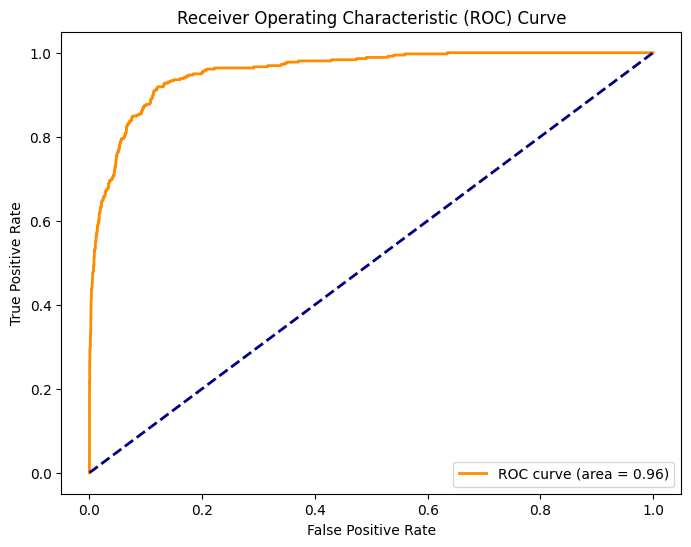

In [85]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

fpr, tpr, thresholds = roc_curve(y_valid, predicted_probabilities[:, 1])
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

In [87]:
def compute_metrics(group):
    top_20 = group.nlargest(20, 'Predicted_Probabilities_Class1')
    if (top_20['target'] == 1).any():  # Проверка наличия хотя бы одной единицы в топ-20
        top_5 = top_20.nlargest(5, 'Predicted_Probabilities_Class1')  # Выбираем топ-5 из топ-20
        true_positives = (top_5['target'] == 1).sum() 
        actual_positives = (group['target'] == 1).sum()  
        accuracy_5 = true_positives  # Accuracy@5
        recall_5 = true_positives / actual_positives if actual_positives != 0 else 0  # Recall@5
        mrr_5 = 1 / (top_5['target'].values.argmax() + 1)  # MRR@5
        return pd.Series({'accuracy@5': accuracy_5, 'recall@5': recall_5, 'mrr@5': mrr_5})
    else:
        return pd.Series({'accuracy@5': np.nan, 'recall@5': np.nan, 'mrr@5': np.nan})

metrics = (
    X1_valid.groupby(np.arange(len(X1_valid)) // 20)
    .apply(compute_metrics)
    .mean()
)
print(metrics)

accuracy@5    0.974860
recall@5      0.974860
mrr@5         0.887663
dtype: float64


Лучший результат  
accuracy@5    0.974860  
recall@5      0.974860  
mrr@5         0.887663  

CatBoost c предварительно кодированными текстовыми данными

На векторизованном объединенном столбце combined_documents и столбце distance обучим CatBoost на предварительно обработанных данных, хотя CatBoost может работать с ними и напрямую

In [94]:
#model = CatBoostClassifier(random_state = 42)

#params = {'learning_rate': [0.1, 0.2],
#          'depth': [4, 10],
#          'l2_leaf_reg': [3, 8],
#          'iterations': [500, 750]}

#gs_ctb = GridSearchCV(model, params, scoring='roc_auc', cv=5, n_jobs=-1, verbose=2)
#gs_ctb.fit(X_train_tfidf, y2_train)

In [95]:
#gs_ctb.best_score_, gs_ctb.best_params_

(0.89801171731434,
 {'depth': 10, 'iterations': 750, 'l2_leaf_reg': 3, 'learning_rate': 0.2})

In [88]:
ctb = CatBoostClassifier(random_state = 42, depth = 10, l2_leaf_reg = 3, iterations = 750, learning_rate = 0.2)
ctb.fit(X_train_tfidf, y2_train)

0:	learn: 0.4087822	total: 179ms	remaining: 2m 14s
1:	learn: 0.2742544	total: 360ms	remaining: 2m 14s
2:	learn: 0.2172473	total: 540ms	remaining: 2m 14s
3:	learn: 0.1658124	total: 718ms	remaining: 2m 13s
4:	learn: 0.1416509	total: 903ms	remaining: 2m 14s
5:	learn: 0.1266786	total: 1.09s	remaining: 2m 15s
6:	learn: 0.1164670	total: 1.27s	remaining: 2m 14s
7:	learn: 0.1097426	total: 1.45s	remaining: 2m 14s
8:	learn: 0.1053986	total: 1.64s	remaining: 2m 15s
9:	learn: 0.1031454	total: 1.83s	remaining: 2m 15s
10:	learn: 0.1014672	total: 2.01s	remaining: 2m 14s
11:	learn: 0.0991598	total: 2.19s	remaining: 2m 14s
12:	learn: 0.0976644	total: 2.37s	remaining: 2m 14s
13:	learn: 0.0962778	total: 2.55s	remaining: 2m 14s
14:	learn: 0.0956350	total: 2.73s	remaining: 2m 13s
15:	learn: 0.0947716	total: 2.91s	remaining: 2m 13s
16:	learn: 0.0937610	total: 3.09s	remaining: 2m 13s
17:	learn: 0.0924527	total: 3.27s	remaining: 2m 12s
18:	learn: 0.0922547	total: 3.45s	remaining: 2m 12s
19:	learn: 0.0913889	t

In [89]:
y_pred = ctb.predict(X_test_tfidf)

accuracy = accuracy_score(y2_test, y_pred)
report = classification_report(y2_test, y_pred)

In [90]:
accuracy

0.9681421864520456

In [91]:
print(report)

              precision    recall  f1-score   support

           0       0.97      0.99      0.98      5738
           1       0.68      0.31      0.42       226

    accuracy                           0.97      5964
   macro avg       0.82      0.65      0.70      5964
weighted avg       0.96      0.97      0.96      5964



Метрики достаточно хорошие, посмотрим, что получается на валидационной выборке

In [92]:
predicted_probabilities = ctb.predict_proba(X_valid_tfidf)

In [93]:
X1_valid['Predicted_Probabilities_Class1'] = predicted_probabilities[:, 1]
X1_valid['target'] = y_valid
X1_valid['name_dealerprice'] = df_nn['name_dealerprice']
X1_valid['name_1c'] = df_nn['name_1c']
X1_valid.drop(['document_set1', 'document_set2'], axis = 1, inplace = True)
X1_valid


,distance,Predicted_Probabilities_Class0,Predicted_Probabilities_Class1,target,name_dealerprice,name_1c
0,0.229923,0.288670,0.724007,1,Средство универсальное Prosept Universal Spray...,Универсальное чистящее средство PROSEPT Univer...
1,0.345664,0.976295,0.010441,0,Средство универсальное Prosept Universal Spray...,Профессиональное чистящее средство PROSEPT Uni...
2,0.392031,0.998213,0.001040,0,Средство универсальное Prosept Universal Spray...,Универсальное моющее и чистящее средствоUniver...
3,0.440355,0.988948,0.001970,0,Средство универсальное Prosept Universal Spray...,Профессиональное универсальное моющее средство...
4,0.457419,0.984619,0.000319,0,Средство универсальное Prosept Universal Spray...,Профессиональное универсальное моющее средство...
...,...,...,...,...,...,...
7455,0.745948,0.994284,0.000068,0,Средство моющее для бань PROSEPT 1 л,Профессиональное универсальное моющее средство...
7456,0.751374,0.999929,0.000386,0,Средство моющее для бань PROSEPT 1 л,"Средство для мытья полов и стенMultipower ""Пол..."
7457,0.752480,0.994614,0.002844,0,Средство моющее для бань PROSEPT 1 л,Средство для мытья полов всех типов PROSEPT Mu...
7458,0.758028,0.995080,0.001244,0,Средство моющее для бань PROSEPT 1 л,Средство для мытья стекол и зеркалOptic Crysta...


In [94]:
result = (
    X1_valid.groupby(X1_valid.index // 20)
    .apply(lambda x: x.sort_values(by='Predicted_Probabilities_Class1', ascending=False))
    .reset_index(drop=True)
)
result

,distance,Predicted_Probabilities_Class0,Predicted_Probabilities_Class1,target,name_dealerprice,name_1c
0,0.229923,0.288670,0.724007,1,Средство универсальное Prosept Universal Spray...,Универсальное чистящее средство PROSEPT Univer...
1,0.609453,0.996500,0.016683,0,Средство универсальное Prosept Universal Spray...,Антисептик ECO UNIVERSAL / 5 л
2,0.345664,0.976295,0.010441,0,Средство универсальное Prosept Universal Spray...,Профессиональное чистящее средство PROSEPT Uni...
3,0.678880,0.993231,0.009285,0,Средство универсальное Prosept Universal Spray...,Антисептик ECO UNIVERSAL / 10 л
4,0.617308,0.894827,0.005616,0,Средство универсальное Prosept Universal Spray...,Универсальный спрей для ванной и туалета от рж...
...,...,...,...,...,...,...
7455,0.683578,0.999016,0.000147,0,Средство моющее для бань PROSEPT 1 л,"Антисептик для бани и сауны PROSEPT ECO SAUNA,..."
7456,0.745948,0.994284,0.000068,0,Средство моющее для бань PROSEPT 1 л,Профессиональное универсальное моющее средство...
7457,0.680177,0.999425,0.000048,0,Средство моющее для бань PROSEPT 1 л,"Антисептик для бани и сауны PROSEPT ECO SAUNA,..."
7458,0.717353,0.999966,0.000025,0,Средство моющее для бань PROSEPT 1 л,Универсальное моющее и чистящее средствоUniver...


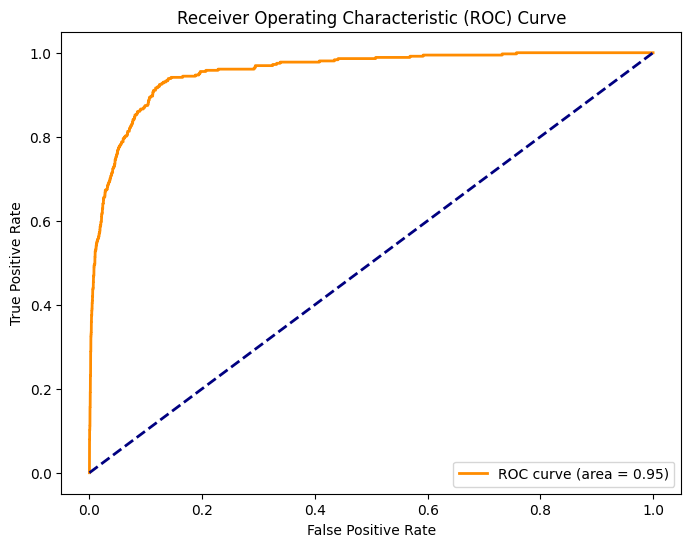

In [95]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

fpr, tpr, thresholds = roc_curve(y_valid, predicted_probabilities[:, 1])
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

In [97]:
def compute_metrics(group):
    top_20 = group.nlargest(20, 'Predicted_Probabilities_Class1')
    if (top_20['target'] == 1).any():  # Проверка наличия хотя бы одной единицы в топ-20
        top_5 = top_20.nlargest(5, 'Predicted_Probabilities_Class1')  # Выбираем топ-5 из топ-20
        true_positives = (top_5['target'] == 1).sum() 
        actual_positives = (group['target'] == 1).sum()  
        accuracy_5 = true_positives  # Accuracy@5
        recall_5 = true_positives / actual_positives if actual_positives != 0 else 0  # Recall@5
        mrr_5 = 1 / (top_5['target'].values.argmax() + 1)  # MRR@5
        return pd.Series({'accuracy@5': accuracy_5, 'recall@5': recall_5, 'mrr@5': mrr_5})
    else:
        return pd.Series({'accuracy@5': np.nan, 'recall@5': np.nan, 'mrr@5': np.nan})

metrics = (
    X1_valid.groupby(np.arange(len(X1_valid)) // 20)
    .apply(compute_metrics)
    .mean()
)
print(metrics)

accuracy@5    0.969274
recall@5      0.969274
mrr@5         0.879935
dtype: float64


accuracy@5    0.969274  
recall@5      0.969274  
mrr@5         0.879935  


In [98]:
X = df_nn[["document_set1", "document_set2", "distance"]]
y = df_nn["target"]

categorical = ["document_set1", "document_set2"]
X[categorical] = X[categorical].astype('str')

In [99]:
ctb_ = CatBoostClassifier(random_state=42, depth = 6, l2_leaf_reg = 5, iterations=500, learning_rate=0.2, text_features=['document_set1', 'document_set2'])
ctb_.fit(X, y)

0:	learn: 0.4498844	total: 52.8ms	remaining: 26.3s
1:	learn: 0.2774045	total: 115ms	remaining: 28.7s
2:	learn: 0.2103433	total: 181ms	remaining: 30s
3:	learn: 0.1724241	total: 241ms	remaining: 29.9s
4:	learn: 0.1467293	total: 304ms	remaining: 30.1s
5:	learn: 0.1374487	total: 364ms	remaining: 30s
6:	learn: 0.1281526	total: 426ms	remaining: 30s
7:	learn: 0.1202207	total: 491ms	remaining: 30.2s
8:	learn: 0.1142862	total: 553ms	remaining: 30.2s
9:	learn: 0.1109832	total: 616ms	remaining: 30.2s
10:	learn: 0.1036284	total: 680ms	remaining: 30.2s
11:	learn: 0.1029268	total: 737ms	remaining: 30s
12:	learn: 0.1016898	total: 800ms	remaining: 30s
13:	learn: 0.1008632	total: 863ms	remaining: 29.9s
14:	learn: 0.1001538	total: 919ms	remaining: 29.7s
15:	learn: 0.0993983	total: 980ms	remaining: 29.7s
16:	learn: 0.0988781	total: 1.04s	remaining: 29.6s
17:	learn: 0.0983245	total: 1.1s	remaining: 29.5s
18:	learn: 0.0981863	total: 1.15s	remaining: 29.2s
19:	learn: 0.0975582	total: 1.21s	remaining: 29s
20

In [100]:
import pickle
with open('trained_catboost_model.pkl', 'wb') as file:
    pickle.dump(ctb_, file)

In [101]:
def load_model(model_path):
    with open(model_path, "rb") as file:
        loaded_model = pickle.load(file)
    return loaded_model

In [102]:
model_path="trained_catboost_model.pkl"
model_ctb = load_model(model_path)

In [103]:
y_pred = model_ctb.predict(X)

accuracy = accuracy_score(y, y_pred)
report = classification_report(y, y_pred)

In [104]:
accuracy

0.9840396995708155

In [105]:
print(report)

              precision    recall  f1-score   support

           0       0.99      1.00      0.99     35793
           1       0.93      0.65      0.76      1487

    accuracy                           0.98     37280
   macro avg       0.96      0.82      0.88     37280
weighted avg       0.98      0.98      0.98     37280



In [106]:
predicted_probabilities = model_ctb.predict_proba(X)[:, 1]

In [107]:
df_nn["Predicted_Class1"] = predicted_probabilities

result = (
    df_nn.groupby(df_nn.index // 20)
    .apply(lambda x: x.sort_values(by="Predicted_Class1", ascending=False))
    .reset_index(drop=True)
)

In [108]:
result

,document_set1,document_set2,name_dealerprice,name_1c,distance,rank,product_id_dealer,product_id,target,combined_documents,Predicted_Class1
0,universal'nyj chistit' universal spray 0.5 litr,universal'nyj universal spray pjat'sot millilitr,Средство универсальное Prosept Universal Spray...,Универсальное чистящее средство PROSEPT Univer...,0.229923,1,12,12,1,universal'nyj chistit' universal spray 0.5 lit...,0.843990
1,universal'nyj sprej vannyj tualet rzhavchina b...,universal'nyj universal spray pjat'sot millilitr,Средство универсальное Prosept Universal Spray...,Универсальный спрей для ванной и туалета от рж...,0.617308,13,12,69,0,universal'nyj sprej vannyj tualet rzhavchina b...,0.113330
2,professional'nyj universal'nyj myt' universal ...,universal'nyj universal spray pjat'sot millilitr,Средство универсальное Prosept Universal Spray...,Профессиональное универсальное моющее средство...,0.440355,4,12,5,0,professional'nyj universal'nyj myt' universal ...,0.064795
3,professional'nyj chistit' universal spray pjat...,universal'nyj universal spray pjat'sot millilitr,Средство универсальное Prosept Universal Spray...,Профессиональное чистящее средство PROSEPT Uni...,0.345664,2,12,13,0,professional'nyj chistit' universal spray pjat...,0.025187
4,universal'nyj myt' chistit' universal spray ko...,universal'nyj universal spray pjat'sot millilitr,Средство универсальное Prosept Universal Spray...,Универсальное моющее и чистящее средствоUniver...,0.392031,3,12,15,0,universal'nyj myt' chistit' universal spray ko...,0.011151
...,...,...,...,...,...,...,...,...,...,...,...
37275,germetik akrilovyj tsvet medovyj 0.6 litr,germetik akrilovyj mezhshovnyj derevjannyj kon...,Герметик акриловый межшовный для деревянных ко...,"Герметик акриловый цвет Медовый 0,6 л",0.595107,15,0,365,0,germetik akrilovyj tsvet medovyj 0.6 litr germ...,0.001190
37276,germetik akrilovyj tsvet medovyj pjatnadtsat' ...,germetik akrilovyj mezhshovnyj derevjannyj kon...,Герметик акриловый межшовный для деревянных ко...,"Герметик акриловый цвет медовый, 15 кг.",0.603330,17,0,459,0,germetik akrilovyj tsvet medovyj pjatnadtsat' ...,0.001165
37277,germetik akrilovyj tsvet belyj f p shest'sot m...,germetik akrilovyj mezhshovnyj derevjannyj kon...,Герметик акриловый межшовный для деревянных ко...,"Герметик акриловый цвет белый, ф/п 600 мл.",0.641269,20,0,437,0,germetik akrilovyj tsvet belyj f p shest'sot m...,0.000915
37278,germetik akrilovyj belyj shov derevjannyj dom ...,germetik akrilovyj mezhshovnyj derevjannyj kon...,Герметик акриловый межшовный для деревянных ко...,Герметик акриловый белый для швов для деревянн...,0.620738,19,0,466,0,germetik akrilovyj belyj shov derevjannyj dom ...,0.000510


In [110]:
def compute_metrics(group):
    top_20 = group.nlargest(20, 'Predicted_Class1')
    if (top_20['target'] == 1).any():  # Проверка наличия хотя бы одной единицы в топ-20
        top_5 = top_20.nlargest(5, 'Predicted_Class1')  # Выбираем топ-5 из топ-20
        true_positives = (top_5['target'] == 1).sum() 
        actual_positives = (group['target'] == 1).sum()  
        accuracy_5 = true_positives  # Accuracy@5
        recall_5 = true_positives / actual_positives if actual_positives != 0 else 0  # Recall@5
        mrr_5 = 1 / (top_5['target'].values.argmax() + 1)  # MRR@5
        return pd.Series({'accuracy@5': accuracy_5, 'recall@5': recall_5, 'mrr@5': mrr_5})
    else:
        return pd.Series({'accuracy@5': np.nan, 'recall@5': np.nan, 'mrr@5': np.nan})  # Если нет единиц в топ-20, возвращаем NaN

 
metrics = (
     df_nn.groupby(np.arange(len(df_nn)) // 20)
     .apply(compute_metrics)
     .mean()
 )
print(metrics)

accuracy@5    0.991930
recall@5      0.991930
mrr@5         0.957297
dtype: float64


CNN и LSTM не доделано, но модели успешно обучаются

In [97]:
%%capture
!pip install torchmetrics

In [98]:
import torch
import torch.nn as nn
import torch.optim as optim

from torch.utils.data import Dataset, DataLoader
from tqdm.notebook import tqdm
import nltk
from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist
nltk.download("punkt")
from torchmetrics import F1Score
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, confusion_matrix


[nltk_data] Downloading package punkt to /home/repl/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [99]:
X_train, X_test, y_train, y_test = train_test_split(df_nn['combined_documents'], df_nn['target'], test_size=0.2, random_state=42, shuffle = True)

In [100]:
y_full = df_nn['target']

In [101]:
X_full = df_nn['combined_documents']

In [102]:
train_corpus = list(X_train)

In [103]:
full_corpus = list(X_full)

In [104]:
tokens = []
for text in tqdm(train_corpus):
  tokens.extend(word_tokenize(text))
tokens_filtered = [word for word in tokens if word.isalnum()]

  0%|          | 0/29824 [00:00<?, ?it/s]

In [105]:
tokens_full = []
for text in tqdm(full_corpus):
  tokens.extend(word_tokenize(text))
tokens_filtered_full = [word for word in tokens if word.isalnum()]

  0%|          | 0/37280 [00:00<?, ?it/s]

In [106]:
max_words = 10000
dist = FreqDist(tokens_filtered)
tokens_filtered_top = [pair[0] for pair in dist.most_common(max_words) if len(pair[0]) > 2]

In [107]:
max_words = 10000
dist = FreqDist(tokens_filtered_full)
tokens_filtered_top_full = [pair[0] for pair in dist.most_common(max_words) if len(pair[0]) > 2]

In [108]:
vocabulary = {v: k for k, v in dict(enumerate(tokens_filtered_top, 1)).items()}

In [109]:
vocabulary_full = {v: k for k, v in dict(enumerate(tokens_filtered_top_full, 1)).items()}

In [110]:
vocab_size = len(vocabulary)
vocab_size

696

In [111]:
vocab_size_full = len(vocabulary_full)
vocab_size_full

696

In [112]:
def text_to_sequence(text, maxlen):
    result = []
    tokens = word_tokenize(text.lower())
    tokens_filtered = [word for word in tokens if word.isalnum()]
    for word in tokens_filtered:
        if word in vocabulary:
            result.append(vocabulary[word])
    padding = [0]*(maxlen-len(result))
    return padding + result[-maxlen:]

In [113]:
def text_to_sequence_full(text, maxlen):
    result = []
    tokens_full = word_tokenize(text.lower())
    tokens_filtered_full = [word for word in tokens_full if word.isalnum()]
    for word in tokens_filtered_full:
        if word in vocabulary_full:
            result.append(vocabulary_full[word])
    padding = [0]*(maxlen-len(result))
    return padding + result[-maxlen:]

In [114]:
max_len = 300
X_train = np.array([text_to_sequence(text, max_len) for text in tqdm(X_train)], dtype=np.int32)
X_test = np.array([text_to_sequence(text, max_len) for text in tqdm(X_test)], dtype=np.int32)

  0%|          | 0/29824 [00:00<?, ?it/s]

  0%|          | 0/7456 [00:00<?, ?it/s]

In [115]:
X_full = np.array([text_to_sequence_full(text, max_len) for text in tqdm(X_full)], dtype=np.int32)

  0%|          | 0/37280 [00:00<?, ?it/s]

In [116]:
y_train = np.array(y_train)
y_test = np.array(y_test)
y_full = np.array(y_full)

CNN

In [117]:
class ConvTextClassifier(nn.Module):
    def __init__(self, vocab_size=vocab_size+1, embedding_dim=128, out_channel=128, num_classes=2):
        super().__init__()
        self.embedding = nn.Embedding(vocab_size, embedding_dim)
        self.conv = nn.Conv1d(embedding_dim, out_channel, kernel_size=3)
        self.relu = nn.ReLU()
        self.linear = nn.Linear(out_channel, num_classes)

    def forward(self, x):
        output = self.embedding(x)
        output = output.permute(0, 2, 1) # bs, emb_dim, len
        output = self.conv(output)
        output = self.relu(output)
        output = torch.max(output, axis=2).values
        output = self.linear(output)
        return output

In [118]:
class TextDataWrapper(Dataset):
    def __init__(self, data, target=None, transform=None):
        self.data = torch.from_numpy(data).long()
        if target is not None:
            self.target = torch.from_numpy(target).long()
        else:
          self.target = None
        self.transform = transform

    def __getitem__(self, index):
        x = self.data[index]
        y = self.target[index] if self.target is not None else -1

        if self.transform:
            x = self.transform(x)
        return x, y

    def __len__(self):
        return len(self.data)

In [119]:
batch_size = 256
epochs = 10

model = ConvTextClassifier()
print(model)
print("Parameters:", sum([param.nelement() for param in model.parameters()]))

f1 = F1Score(task="binary")

optimizer = torch.optim.Adam(model.parameters(), lr=10e-3)
criterion = nn.CrossEntropyLoss()

train_dataset = TextDataWrapper(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

test_dataset = TextDataWrapper(X_test, y_test)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True)


loss_history = []

for epoch in range(1,epochs+1):
    print(f"Train epoch {epoch}/{epochs}")
    temp_loss = []
    temp_metrics = []
    all_predictions = []
    all_targets = []

    model.train()
    for i, (data, target) in enumerate(train_loader):
        optimizer.zero_grad()

        data = data
        target = target
        output = model(data)

        loss = criterion(output, target)
        loss.backward()

        optimizer.step()
        temp_loss.append(loss.float().item())
        temp_metrics.append(f1(output.argmax(1), target).item())

        all_predictions.extend(output.argmax(1).tolist())
        all_targets.extend(target.tolist())

    model.eval()

    test_predictions = []
    test_targets = []

    with torch.no_grad():
        for data, target in test_loader:
            data = data
            target = target

            output = model(data)

            test_predictions.extend(output.argmax(1).tolist())
            test_targets.extend(target.tolist())

    epoch_loss = np.array(temp_loss).mean()
    epoch_f1 = np.array(temp_metrics).mean()

    accuracy = accuracy_score(all_targets, all_predictions)
    precision = precision_score(all_targets, all_predictions)
    confusion = confusion_matrix(all_targets, all_predictions)

    print(f'Loss: {epoch_loss}, f1 score: {epoch_f1}')
    print(f'Accuracy: {accuracy}, Precision: {precision}')
    print('Confusion Matrix:')
    print(confusion)

    test_accuracy = accuracy_score(test_targets, test_predictions)
    test_precision = precision_score(test_targets, test_predictions)
    test_confusion = confusion_matrix(test_targets, test_predictions)

    print("Test Accuracy: ", test_accuracy)
    print("Test Precision: ", test_precision)
    print("Test Confusion Matrix:\n", test_confusion)

ConvTextClassifier(
  (embedding): Embedding(697, 128)
  (conv): Conv1d(128, 128, kernel_size=(3,), stride=(1,))
  (relu): ReLU()
  (linear): Linear(in_features=128, out_features=2, bias=True)
)
Parameters: 138754
Train epoch 1/10
Loss: 0.1945248937122842, f1 score: 0.006602321616095356
Accuracy: 0.9576180257510729, Precision: 0.0784313725490196
Confusion Matrix:
[[28552    94]
 [ 1170     8]]
Test Accuracy:  0.9585568669527897
Test Precision:  0.0
Test Confusion Matrix:
 [[7147    0]
 [ 309    0]]
Train epoch 2/10
Loss: 0.1410052882682564, f1 score: 0.05081480563196362
Accuracy: 0.9599315987124464, Precision: 0.41237113402061853
Confusion Matrix:
[[28589    57]
 [ 1138    40]]
Test Accuracy:  0.9588251072961373
Test Precision:  0.625
Test Confusion Matrix:
 [[7144    3]
 [ 304    5]]
Train epoch 3/10
Loss: 0.13845339802722645, f1 score: 0.1436455313466553
Accuracy: 0.9590598175965666, Precision: 0.43582089552238806
Confusion Matrix:
[[28457   189]
 [ 1032   146]]
Test Accuracy:  0.958

In [120]:
full_dataset = TextDataWrapper(X_full, y_full)
full_loader = DataLoader(full_dataset, batch_size=batch_size)

all_predictions = []
all_probabilities = []

model.eval()

with torch.no_grad():
    for data, target in full_loader:
        data = data
        target = target

        output = model(data)

        probabilities = torch.softmax(output, dim=1)  # Преобразование logits в вероятности
        all_predictions.extend(output.argmax(1).tolist())
        all_probabilities.extend(probabilities.tolist())


LSTM

In [121]:
class LSTMTextClassifier(nn.Module):
    def __init__(self, vocab_size=vocab_size+1, embedding_dim=128, hidden_dim=128, num_classes=2):
        super().__init__()
        self.embedding = nn.Embedding(vocab_size, embedding_dim)
        self.lstm = nn.LSTM(embedding_dim, hidden_dim, batch_first=True)
        self.linear = nn.Linear(hidden_dim, num_classes)

    def forward(self, x):
        embedded = self.embedding(x)
        output, _ = self.lstm(embedded)
        last_hidden_state = output[:, -1, :]
        output = self.linear(last_hidden_state)
        return output

In [122]:
class LSTMDataset(Dataset):
    def __init__(self, data, target=None, transform=None):
        self.data = torch.from_numpy(data).long()
        if target is not None:
            self.target = torch.from_numpy(target).long()
        else:
            self.target = None
        self.transform = transform

    def __getitem__(self, index):
        x = self.data[index]
        y = self.target[index] if self.target is not None else -1

        if self.transform:
            x = self.transform(x)
        return x, y

    def __len__(self):
        return len(self.data)

In [123]:
batch_size = 256
epochs = 10
learning_rate = 0.001

model = LSTMTextClassifier()

print(model)
print("Parameters:", sum([param.nelement() for param in model.parameters()]))


criterion = nn.CrossEntropyLoss()

optimizer = optim.Adam(model.parameters(), lr=learning_rate)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True)

loss_history = []

for epoch in range(1, epochs + 1):
    print(f"Train epoch {epoch}/{epochs}")
    temp_loss = []

    all_predictions = []
    all_targets = []

    model.train()

    for i, (data, target) in enumerate(train_loader):
        optimizer.zero_grad()

        data = data
        target = target
        output = model(data)

        loss = criterion(output, target)
        loss.backward()

        optimizer.step()
        temp_loss.append(loss.float().item())

        all_predictions.extend(output.argmax(1).tolist())
        all_targets.extend(target.tolist())

    test_predictions = []
    test_targets = []

    model.eval()

    with torch.no_grad():
        for data, target in test_loader:
            data = data
            target = target
            output = model(data)
            test_predictions.extend(output.argmax(1).tolist())
            test_targets.extend(target.tolist())


    epoch_loss = np.array(temp_loss).mean()

    accuracy = accuracy_score(all_targets, all_predictions)
    precision = precision_score(all_targets, all_predictions)
    confusion = confusion_matrix(all_targets, all_predictions)

    print(f'Loss: {epoch_loss}')
    print(f'Accuracy: {accuracy}, Precision: {precision}')
    print('Confusion Matrix:')
    print(confusion)

    test_accuracy = accuracy_score(test_targets, test_predictions)
    test_precision = precision_score(test_targets, test_predictions)
    test_confusion = confusion_matrix(test_targets, test_predictions)

    print("Test Accuracy: ", test_accuracy)
    print("Test Precision: ", test_precision)
    print("Test Confusion Matrix:\n", test_confusion)

LSTMTextClassifier(
  (embedding): Embedding(697, 128)
  (lstm): LSTM(128, 128, batch_first=True)
  (linear): Linear(in_features=128, out_features=2, bias=True)
)
Parameters: 221570
Train epoch 1/10
Loss: 0.2012772472240986
Accuracy: 0.9508784871244635, Precision: 0.023255813953488372
Confusion Matrix:
[[28352   294]
 [ 1171     7]]
Test Accuracy:  0.9585568669527897
Test Precision:  0.0
Test Confusion Matrix:
 [[7147    0]
 [ 309    0]]
Train epoch 2/10
Loss: 0.16620118049984303
Accuracy: 0.9605016094420601, Precision: 0.0
Confusion Matrix:
[[28646     0]
 [ 1178     0]]
Test Accuracy:  0.9585568669527897
Test Precision:  0.0
Test Confusion Matrix:
 [[7147    0]
 [ 309    0]]
Train epoch 3/10
Loss: 0.16456897072812432
Accuracy: 0.9605016094420601, Precision: 0.0
Confusion Matrix:
[[28646     0]
 [ 1178     0]]
Test Accuracy:  0.9585568669527897
Test Precision:  0.0
Test Confusion Matrix:
 [[7147    0]
 [ 309    0]]
Train epoch 4/10
Loss: 0.15965591406083515
Accuracy: 0.960501609442060

Доразобраться с CNN и LSTM не успели